# Read & Visualize data

In [1]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
from google.colab import drive

import warnings
warnings.filterwarnings("ignore")

drive.mount("/content/drive")
os.chdir("drive/My Drive/RecSys/data")
!pwd

Mounted at /content/drive
/content/drive/My Drive/RecSys/data


In [2]:
data = pd.read_csv("data.csv")
genre_data = pd.read_csv('data_by_genres.csv')
year_data = pd.read_csv('data_by_year.csv')

In [3]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [4]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [5]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


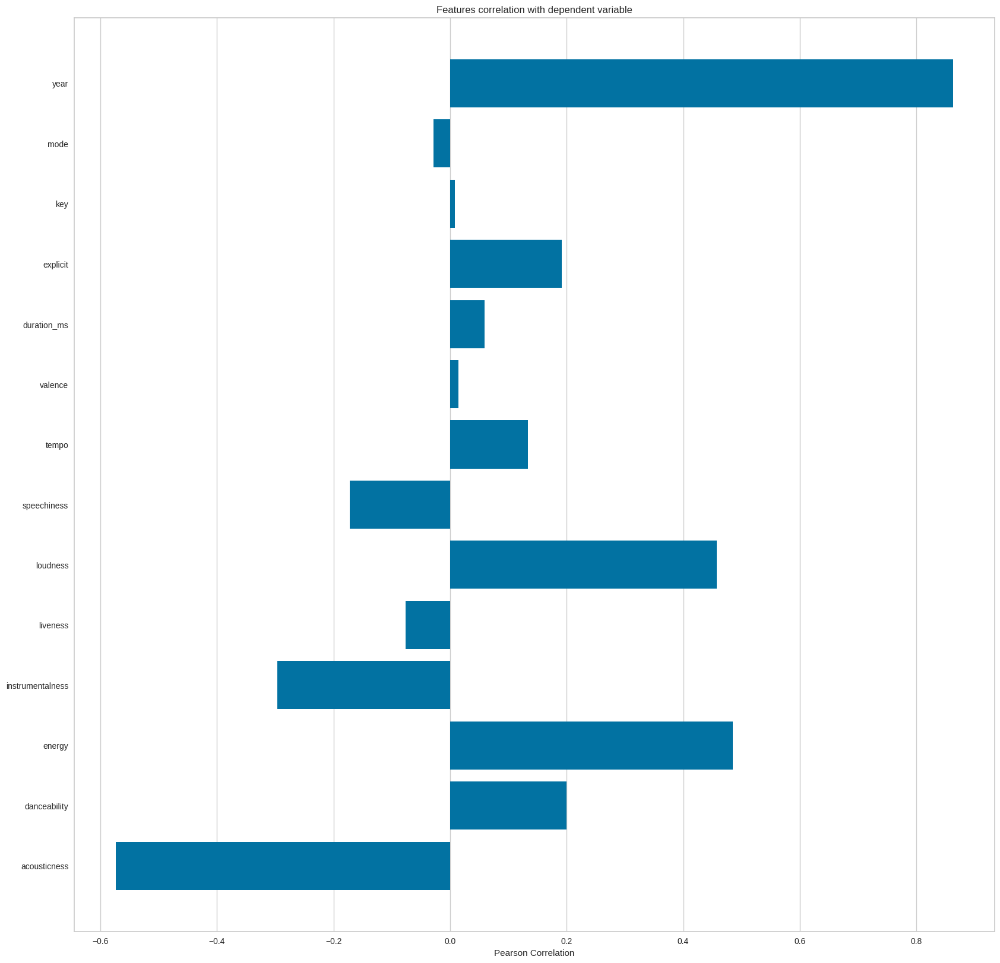

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [6]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

Biểu đồ FeatureCorrelation giúp hiểu mức độ tương quan giữa các đặc trưng (features) và biến mục tiêu ('popularity' trong trường hợp này). Mỗi điểm trên biểu đồ thể hiện mối quan hệ giữa một đặc trưng và biến mục tiêu. Đường chéo của biểu đồ thường thể hiện phân phối của biến mục tiêu.

Điểm đặc trưng và biến mục tiêu càng gần nhau, điểm càng gần đường chéo, thì mối tương quan càng mạnh. Ngược lại, nếu điểm phân tán khắp nơi, mối tương quan có thể là yếu hoặc không tồn tại.

Biểu đồ này giúp đánh giá xem mỗi đặc trưng có đóng góp như thế nào vào biến mục tiêu, từ đó hỗ trợ quá trình chọn lọc hoặc xử lý đặc trưng trong quy trình máy học.

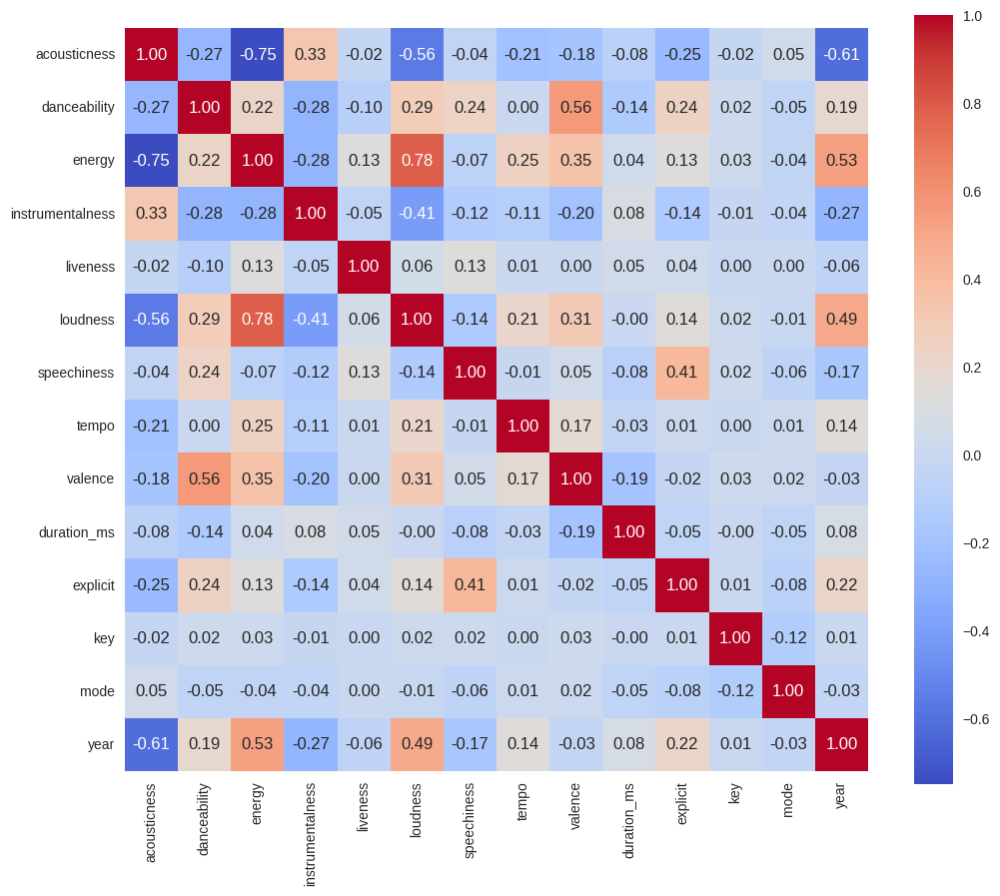

In [7]:
# List of feature names
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

# Extract features
X = data[feature_names]

# Compute the correlation matrix
correlation_matrix = X.corr()

# Set the size of the plot
plt.rcParams['figure.figsize'] = (12, 10)

# Create a heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)

# Show the plot
plt.show()

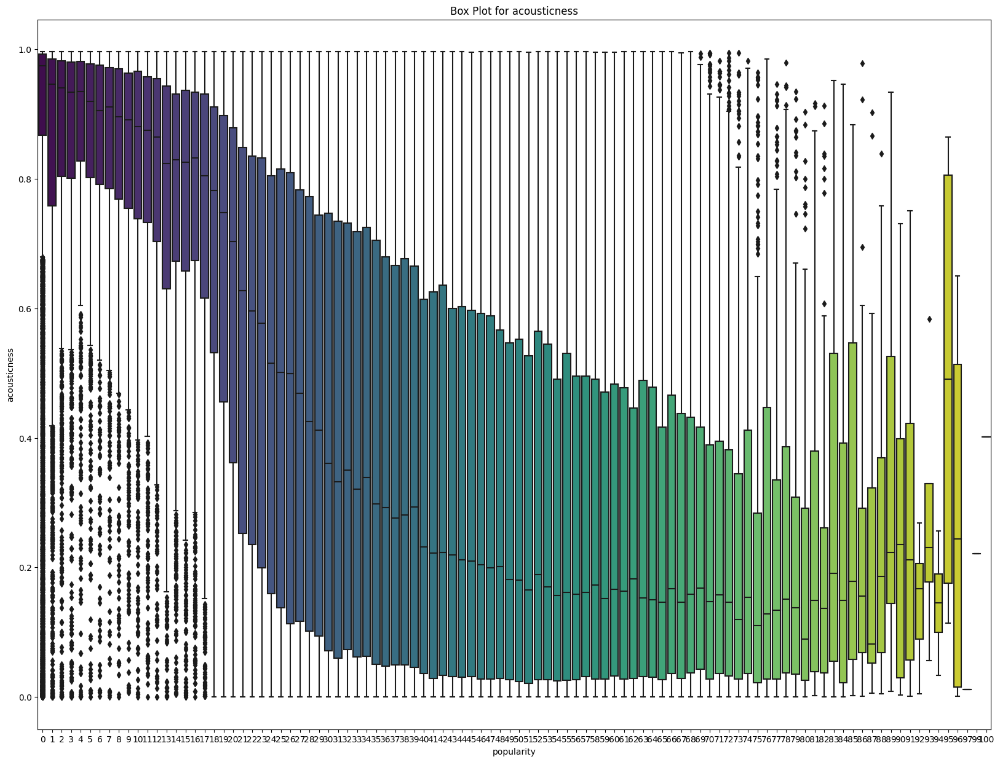

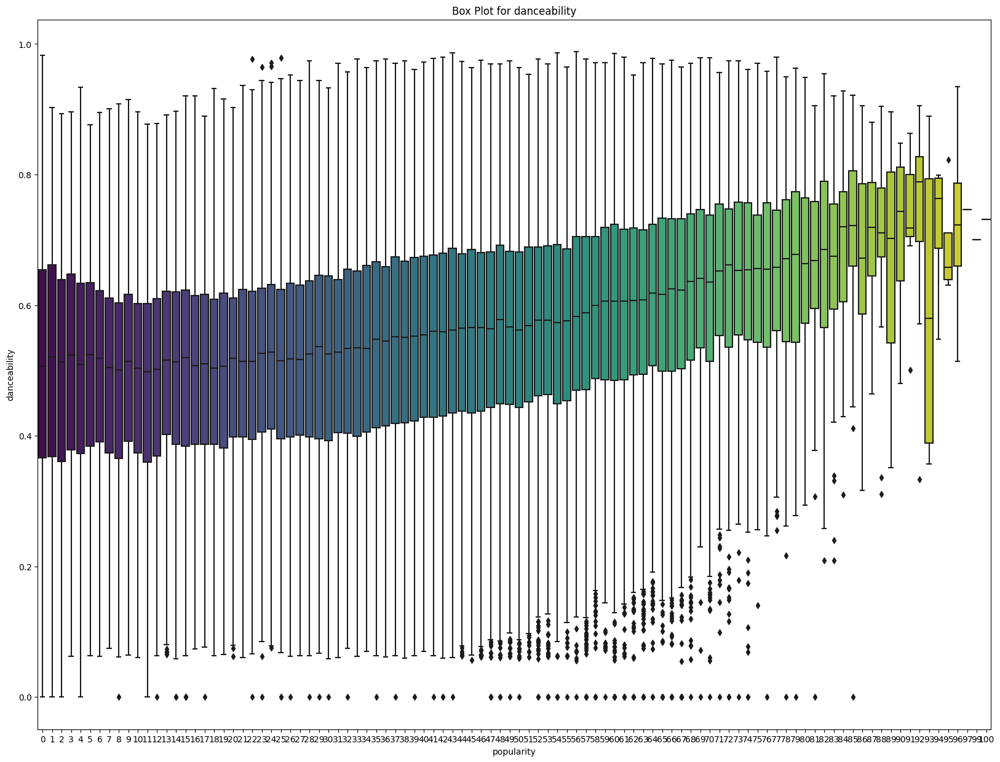

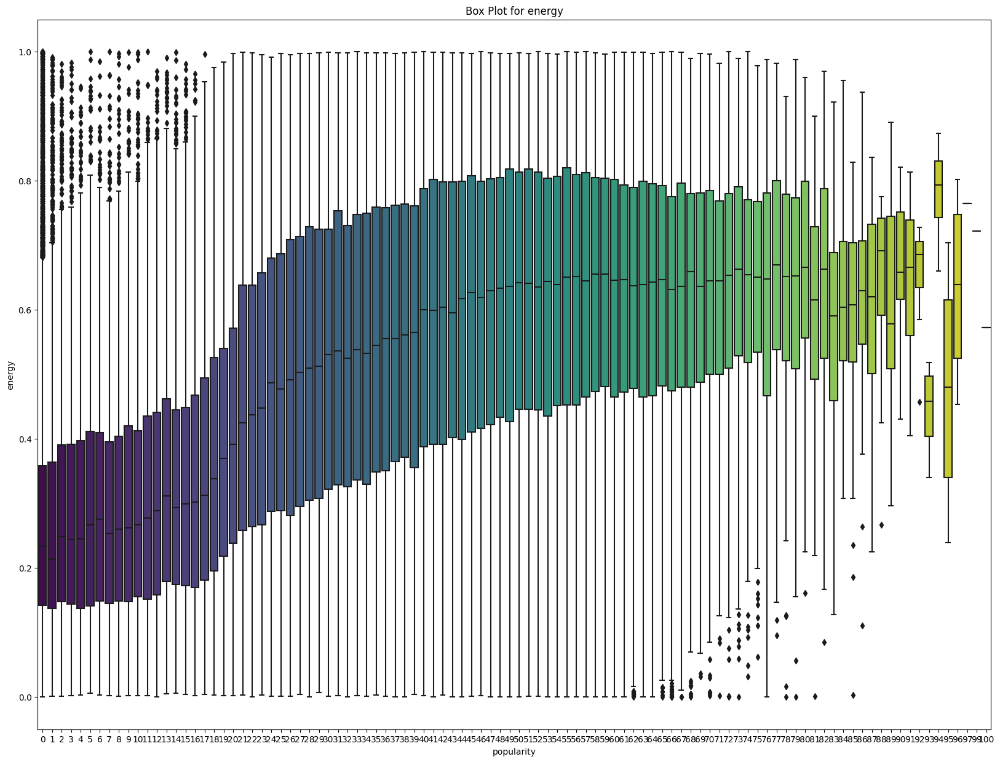

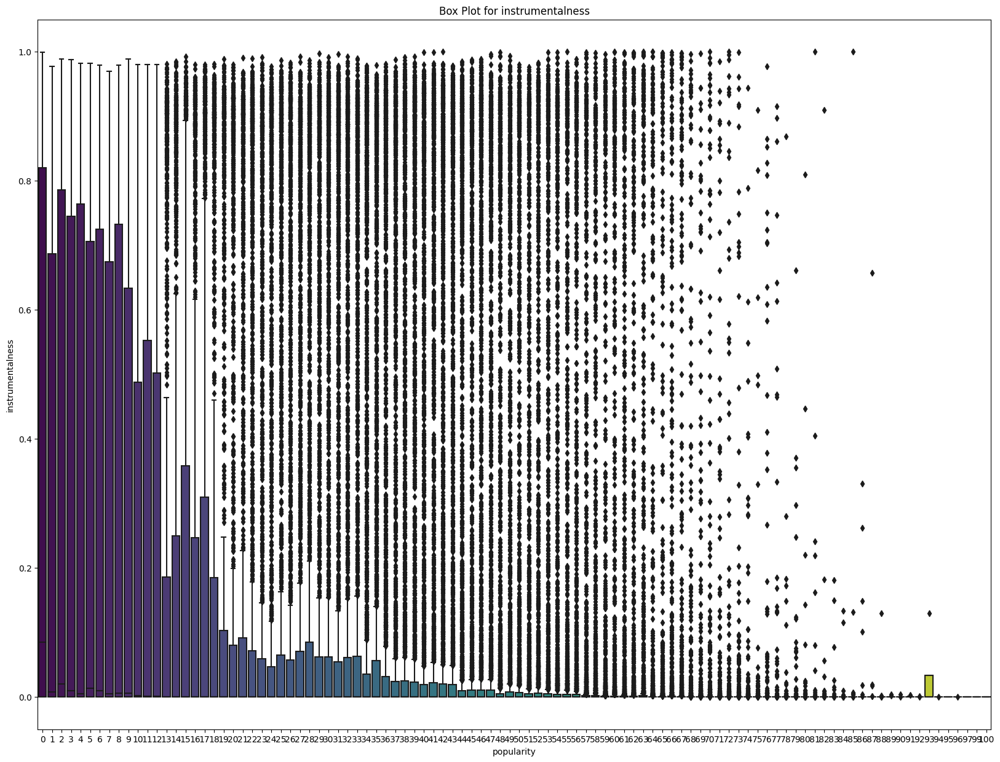

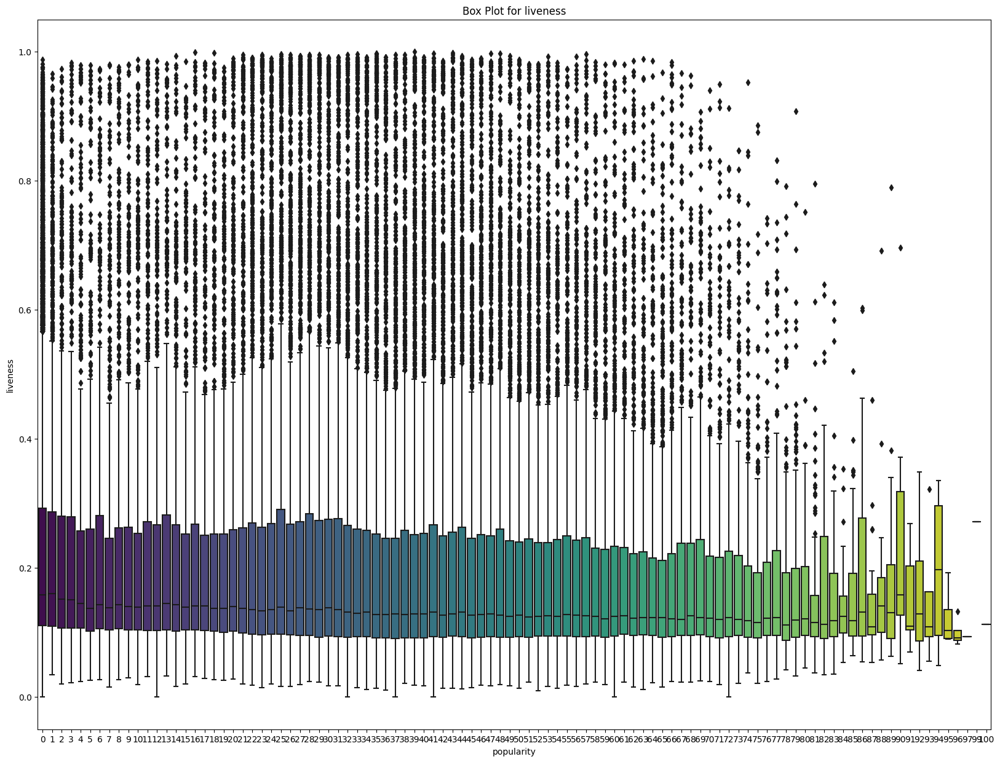

...

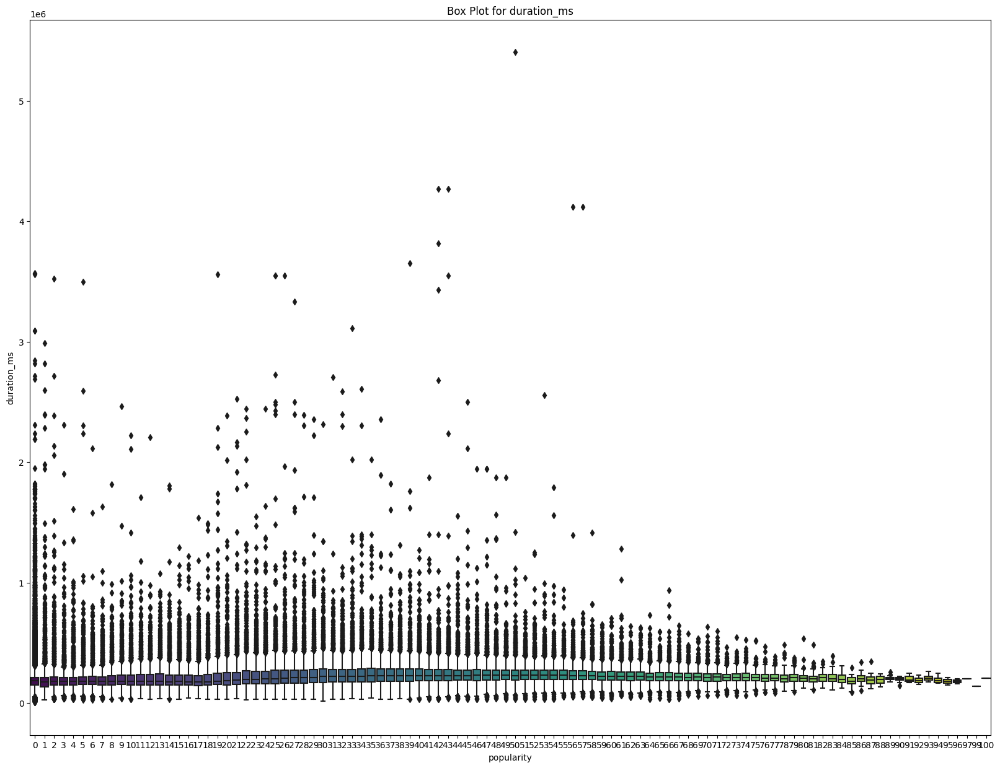

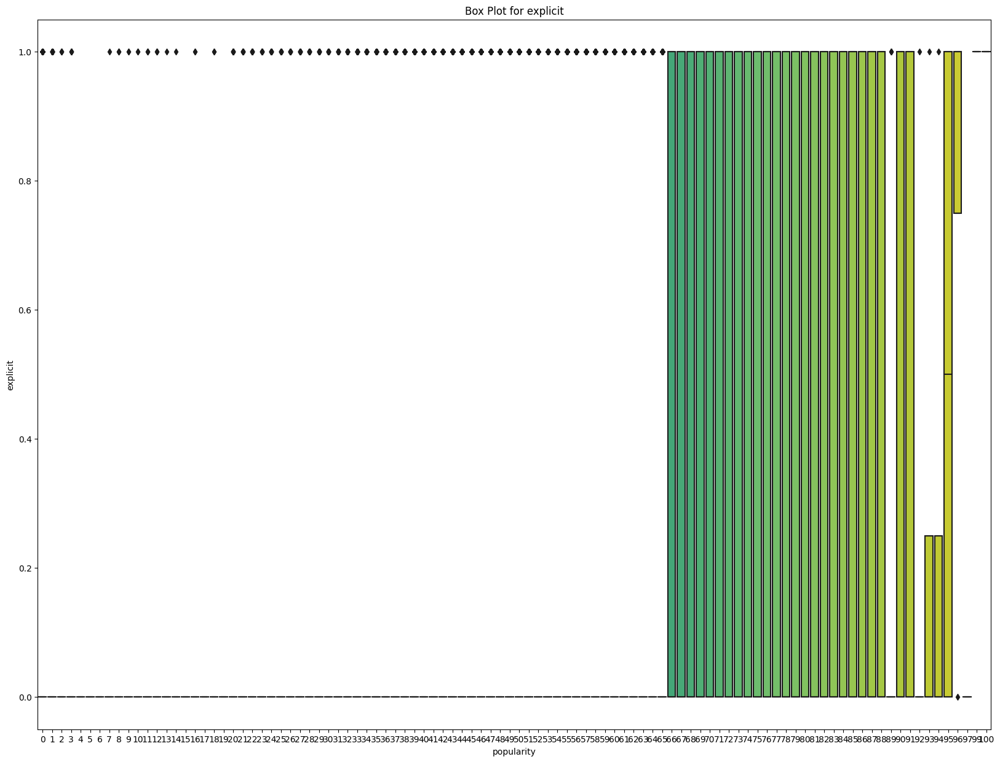

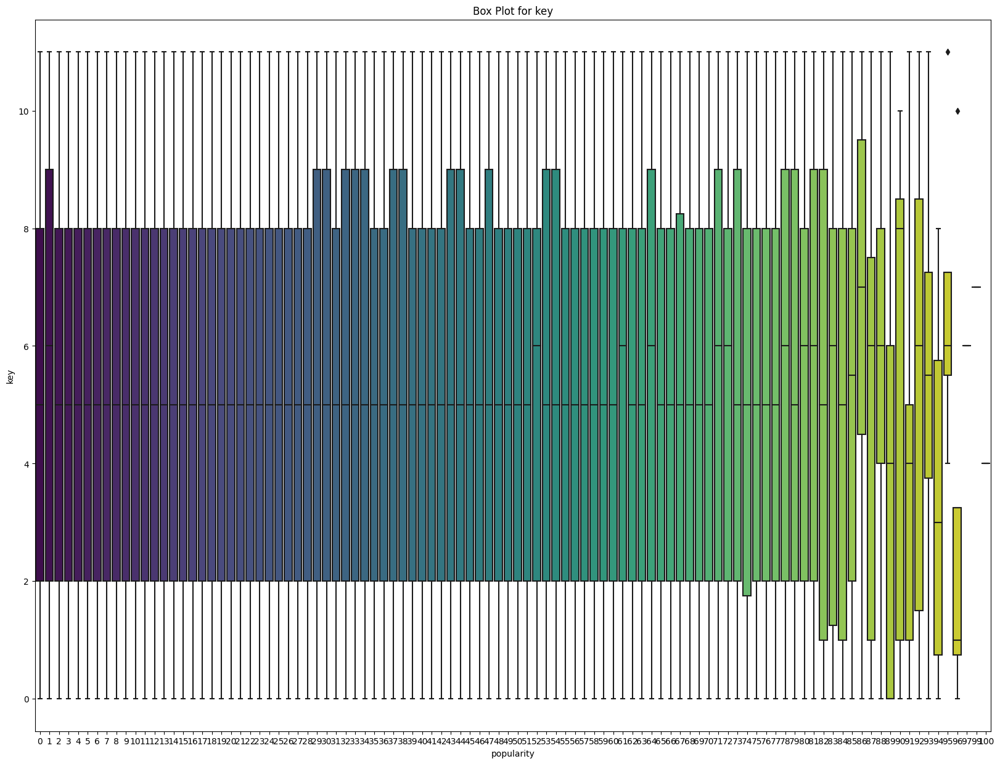

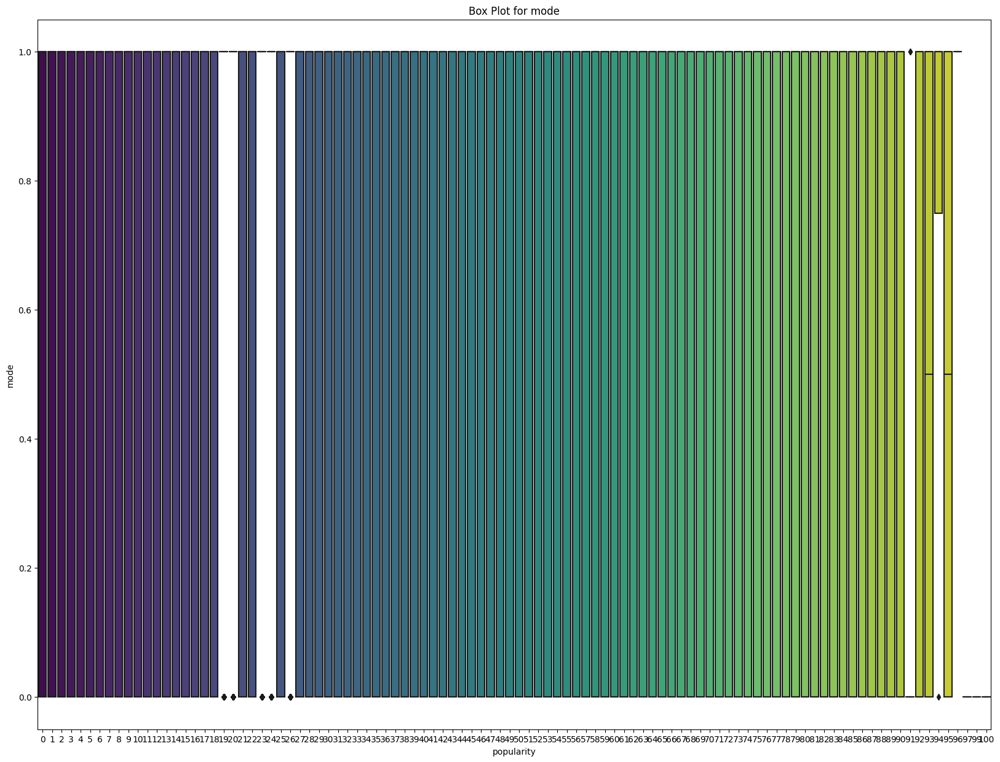

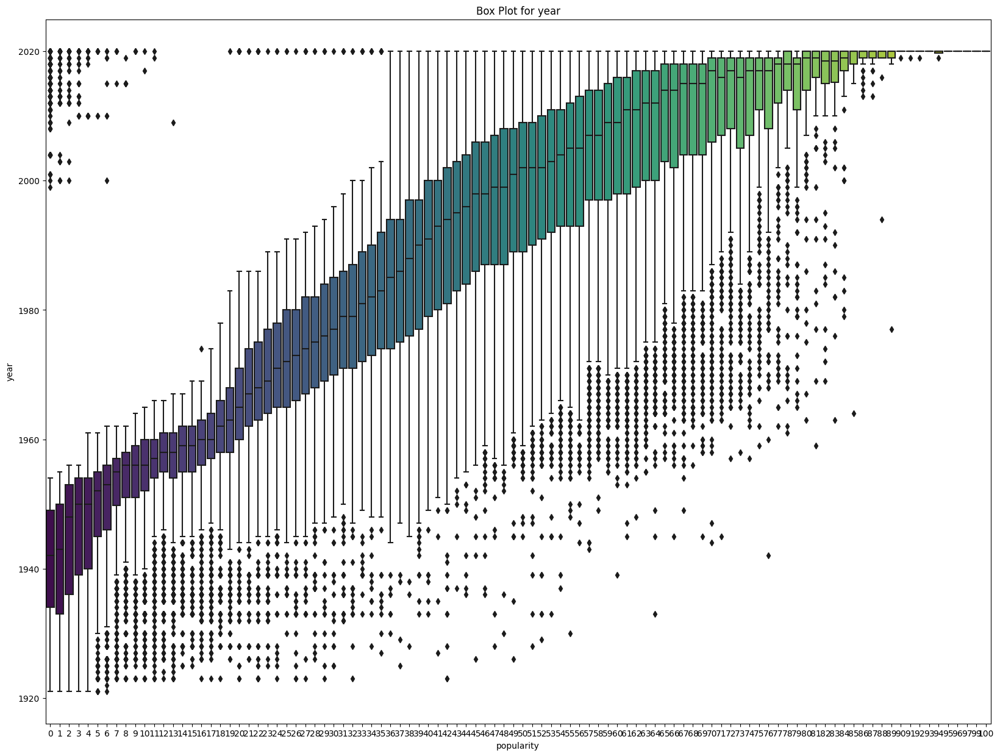

In [ ]:
# List of feature names
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

# Extract features and target variable
X, y = data[feature_names], data['popularity']

# Combine features and target variable into a single DataFrame for Seaborn
df = X.copy()
df['popularity'] = y

# Set the size of the plot
plt.rcParams['figure.figsize'] = (20, 15)

# Create box plots for each feature
for feature in feature_names:
    sns.boxplot(x='popularity', y=feature, data=df, palette='viridis')
    plt.title(f'Box Plot for {feature}')
    plt.show()

Mỗi box plot trên biểu đồ thể hiện phân phối của giá trị đặc trưng tương ứng theo các mức độ "popularity". Hình dạng của các hộp (box) và vị trí của các đường median (đường giữa hộp) giúp hiểu về phân phối và phân tán của các đặc trưng theo mức độ phổ biến.

## Song over time

In [8]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

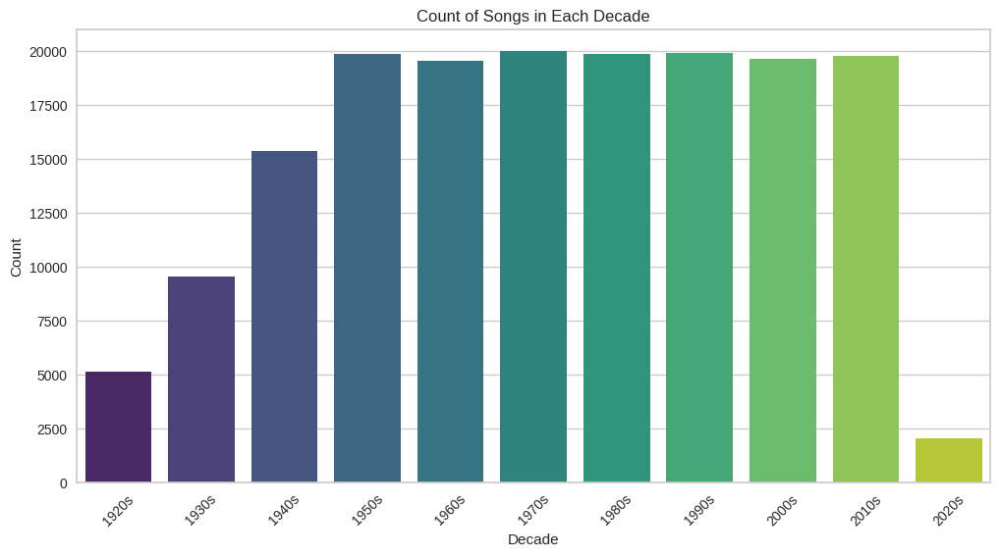

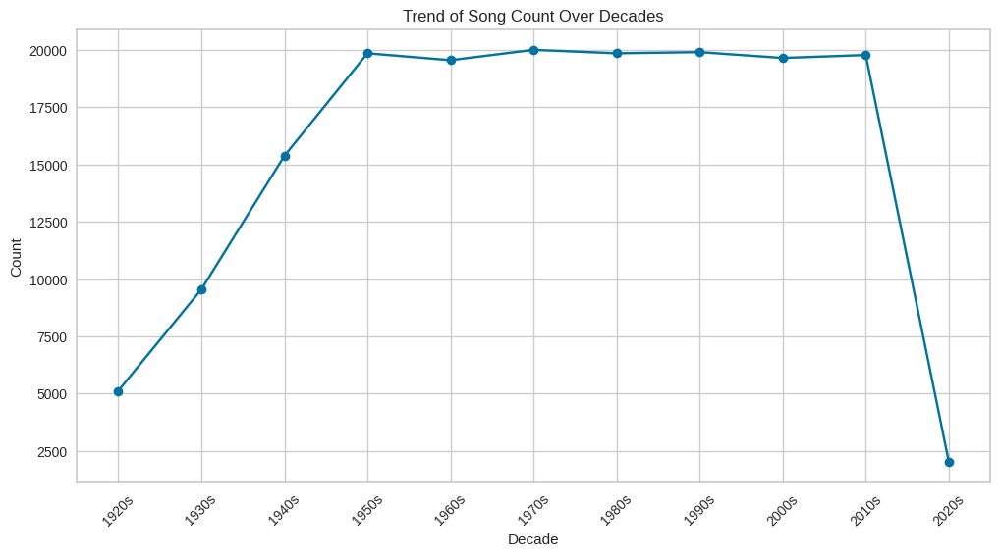

In [9]:
# Set the size of the plot
plt.rcParams['figure.figsize'] = (12, 6)

# Create a bar plot to visualize the count of songs in each decade
sns.countplot(x='decade', data=data, palette='viridis')
plt.title('Count of Songs in Each Decade')
plt.xlabel('Decade')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Create a line plot to visualize the trend of song count over decades
decade_counts = data['decade'].value_counts().sort_index()
plt.plot(decade_counts.index, decade_counts.values, marker='o', linestyle='-')
plt.title('Trend of Song Count Over Decades')
plt.xlabel('Decade')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

Biểu đồ cột: Hiển thị số lượng bài hát trong mỗi thập kỷ, giúp bạn thấy rõ sự phân phối và tần suất của các năm trong dữ liệu.

Biểu đồ đường: Cho thấy xu hướng tăng giảm của số lượng bài hát qua các thập kỷ, giúp đánh giá sự biến động và phát triển của âm nhạc qua thời gian.






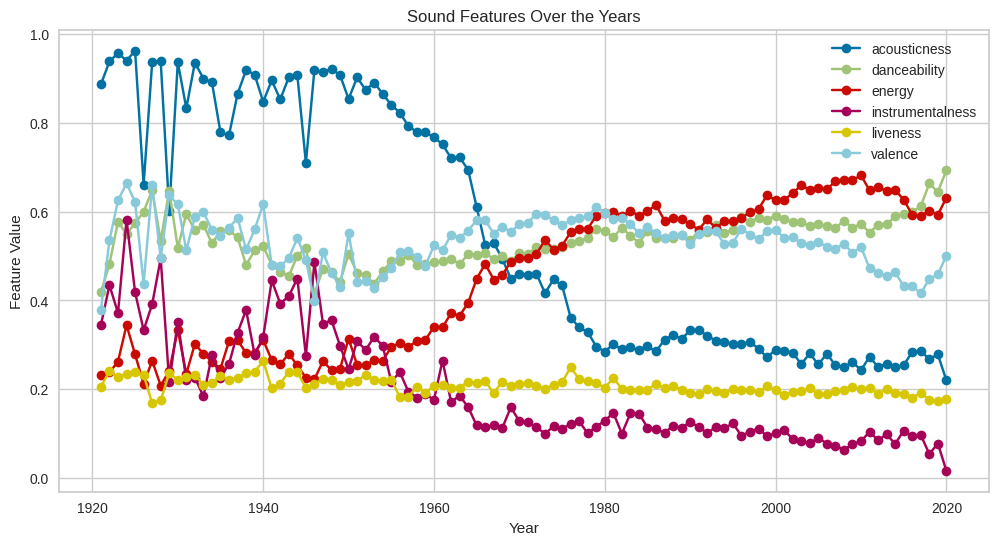

In [10]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# Set the size of the plot
plt.rcParams['figure.figsize'] = (12, 6)

# Create a line plot for each sound feature
for feature in sound_features:
    plt.plot(year_data['year'], year_data[feature], label=feature, marker='o', linestyle='-')

# Add labels and title
plt.title('Sound Features Over the Years')
plt.xlabel('Year')
plt.ylabel('Feature Value')
plt.legend()  # Add a legend to identify each line
plt.show()

## Characteristics of genres

In [11]:
top10_genres = genre_data.nlargest(10, 'popularity')


In [12]:
top10_genres = genre_data.nlargest(10, 'popularity')

# Define custom colors for each feature
colors = {'valence': 'blue', 'energy': 'red', 'danceability': 'green', 'acousticness': 'purple'}

# Create a bar chart with custom colors
fig = px.bar(
    top10_genres,
    x='genres',
    y=['valence', 'energy', 'danceability', 'acousticness'],
    barmode='group',
    color_discrete_map=colors
)

# Show the plot
fig.show()

## Clustering genres with K-means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.323s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106232
[t-SNE] KL divergence after 1000 iterations: 1.392657


## Clustering songs with K-means

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

# Build Recommender System using spotify api to get data

In [ ]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 2.6 MB/s eta 0:00:00


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="2513534b0f8e4a1e8c10dafc0d3738a4",
                                                           client_secret="d20826acb9884b5fbe3cc8903406b9df"))

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
recommend_songs([{'name': 'City of stars', 'year': 1993},
                {'name': 'Can\'t take my eyes off you', 'year': 2017},
                {'name': 'Can\'t help falling in love', 'year': 1961},
                {'name': 'Take me to your heart', 'year':1999},
                {'name': 'Suspicious Minds', 'year': 1969},
                {'name': 'Both sides now', 'year': 2021}],  data)

[{'name': 'you were good to me',
  'year': 2019,
  'artists': "['Jeremy Zucker', 'Chelsea Cutler']"},
 {'name': 'Happiest Year', 'year': 2019, 'artists': "['Jaymes Young']"},
 {'name': 'Dancing On My Own', 'year': 2018, 'artists': "['Calum Scott']"},
 {'name': 'Hey There Delilah',
  'year': 2005,
  'artists': '["Plain White T\'s"]'},
 {'name': 'Whiskey And You', 'year': 2015, 'artists': "['Chris Stapleton']"},
 {'name': 'Big Black Car', 'year': 2009, 'artists': "['Gregory Alan Isakov']"},
 {'name': "Where's My Love - Acoustic", 'year': 2017, 'artists': "['SYML']"},
 {'name': 'Harvest Moon', 'year': 1992, 'artists': "['Neil Young']"},
 {'name': "Heart's Content", 'year': 2012, 'artists': "['Brandi Carlile']"},
 {'name': 'She', 'year': 2019, 'artists': "['dodie']"}]